In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random

# Read Image

In [2]:
img = cv2.imread("/content/Resource/Mini.jpg")
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
img = cv2.resize(img,(512,512))

# Copy an Instance

In [3]:
original_img = img.copy()

In [4]:
height,width = img.shape

# Adding Salt and Pepper

In [5]:
def make_noisy_image(img, percentage_of_salt_pepper):

    noisy_img = img.copy()


    total_pixel = height*width
    effected_pixels = round(percentage_of_salt_pepper*total_pixel)
    # print("Total Pixels : ",total_pixel)
    unlucky_pixels = {}
    print("Effected Pixels:", round(percentage_of_salt_pepper*total_pixel))

    for i in range (effected_pixels):
        # generate two random index
        rand_i = random.randint(0,height-1)
        rand_j = random.randint(0,width-1)

        while(noisy_img[rand_i][rand_j]==255 or noisy_img[rand_i][rand_j]==0):
            rand_i = random.randint(0,height-1)
            rand_j = random.randint(0,width-1)

        # A dictionary to count lucky pixels.
        # Lucky pixels are those who are not effected by salt/pepper
        if (rand_i,rand_j) in unlucky_pixels:
            unlucky_pixels[(rand_i,rand_j)]+=1
        else:
            unlucky_pixels[(rand_i,rand_j)] = 1

        if i%2 == 0:
            noisy_img[rand_i][rand_j] = 255 # Pepper
        else:
            noisy_img[rand_i][rand_j] = 0 # Salt

    print("Lucky Pixels : ",total_pixel-len(unlucky_pixels))
    return noisy_img

# Test of Salt-Pepper Function

Effected Pixels: 131072
Lucky Pixels :  131072


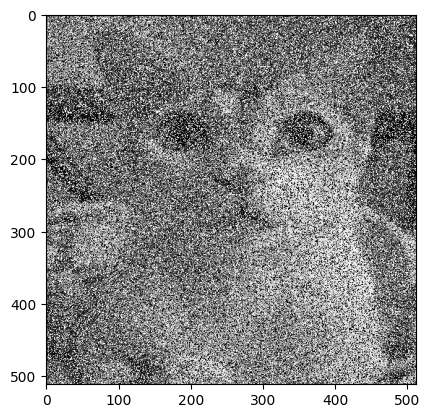

In [6]:
plt.imshow(make_noisy_image(original_img,0.5),cmap='gray')

# PSNR Calculator

In [7]:
def calculate_PSNR(img,noisy_img):
    img = img.astype(np.float128)
    noisy_img = noisy_img.astype(np.float128)

    max_pixel = np.max(img)
    mean_squared_error = np.mean((img - noisy_img)**2)
    PSNR = 20*np.log(max_pixel)-10*np.log(mean_squared_error)

    return round(PSNR,2)

# Test PSNR Calculator

In [8]:
calculate_PSNR(img,img)

<ipython-input-7-8b2f625b0f40>:7: RuntimeWarning: divide by zero encountered in log
  PSNR = 20*np.log(max_pixel)-10*np.log(mean_squared_error)


inf

In [9]:
calculate_PSNR(make_noisy_image(img,0.1),img)

Effected Pixels: 26214
Lucky Pixels :  235930


35.52

In [10]:
calculate_PSNR(make_noisy_image(img,0.5),img)

Effected Pixels: 131072
Lucky Pixels :  131072


19.42

In [11]:
calculate_PSNR(make_noisy_image(img,0.9),img)

Effected Pixels: 235930
Lucky Pixels :  26214


13.54

# Filtering Image Function

In [12]:
def filter_image(noise_mat,filter_type):
    filtered_image = noise_mat.copy()

    mask_size = 5 #3x3

    if filter_type == "median":
        for i in range (mask_size,height-mask_size):
            for j in range(mask_size,width-mask_size):
                median = np.median(noise_mat[i-mask_size:i+mask_size,j-mask_size:j+mask_size])
                filtered_image[i][j] = median

        return filtered_image

    elif filter_type== "average":
        for i in range (mask_size,height-mask_size):
            for j in range(mask_size,width-mask_size):
                avg = np.mean(noise_mat[i-mask_size:i+mask_size,j-mask_size:j+mask_size])
                filtered_image[i][j] = avg

        return filtered_image


Effected Pixels: 235930
Lucky Pixels :  26214


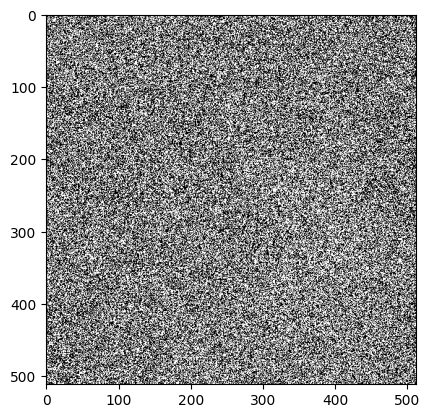

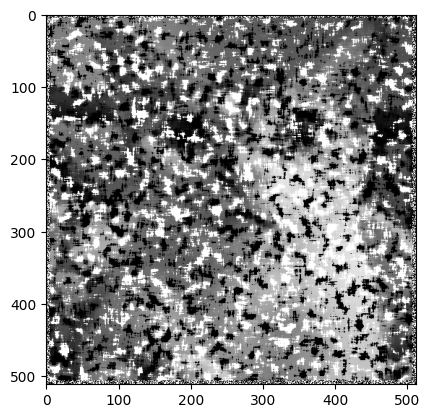

In [13]:
test_noisy_image = make_noisy_image(original_img,0.90)

plt.imshow(test_noisy_image,cmap='gray')
plt.show()

filtered_image = filter_image(test_noisy_image,"median")
plt.imshow(filtered_image,cmap='gray')
plt.show()

# Apply Median Filter

### Subplots

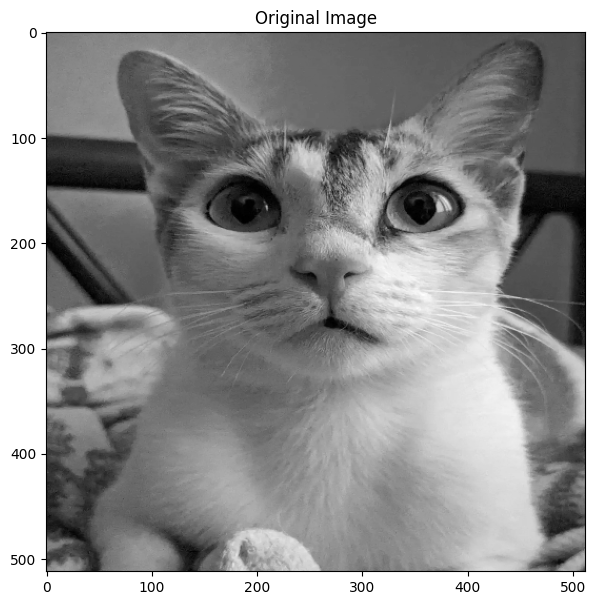

Effected Pixels: 13173
Lucky Pixels :  248971
Salt Applied : 0.05025125628140704
Generated Noisy Image Image : 1/20


<ipython-input-15-1643fef5293b>:21: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(10,2,i) #3


Generated Filtered Image : 2/20
Effected Pixels: 39519
Lucky Pixels :  222625
Salt Applied : 0.15075376884422112
Generated Noisy Image Image : 3/20
Generated Filtered Image : 4/20
Effected Pixels: 65865
Lucky Pixels :  196279
Salt Applied : 0.2512562814070352
Generated Noisy Image Image : 5/20
Generated Filtered Image : 6/20
Effected Pixels: 92211
Lucky Pixels :  169933
Salt Applied : 0.35175879396984927
Generated Noisy Image Image : 7/20
Generated Filtered Image : 8/20
Effected Pixels: 118558
Lucky Pixels :  143586
Salt Applied : 0.45226130653266333
Generated Noisy Image Image : 9/20
Generated Filtered Image : 10/20
Effected Pixels: 144904
Lucky Pixels :  117240
Salt Applied : 0.5527638190954774
Generated Noisy Image Image : 11/20
Generated Filtered Image : 12/20
Effected Pixels: 171250
Lucky Pixels :  90894
Salt Applied : 0.6532663316582915
Generated Noisy Image Image : 13/20
Generated Filtered Image : 14/20
Effected Pixels: 197596
Lucky Pixels :  64548
Salt Applied : 0.7537688442211

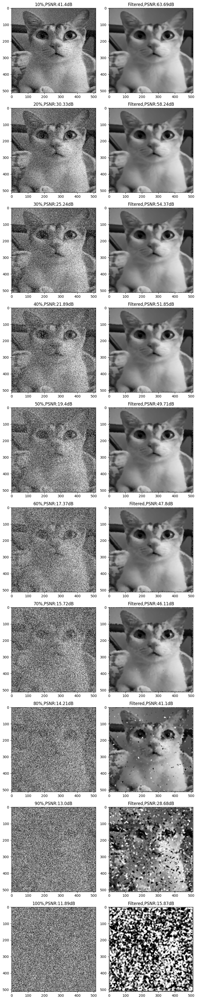

In [15]:
# Original Image Plot
plt.figure(figsize=(7,7))
plt.imshow(original_img,cmap='gray')
plt.title("Original Image")
plt.show()

plt.figure(figsize=(8,40))
plt.title("Noisy Image & Median Filter")
# Noisy - Filtered Image Plot

cnt = 10

for i in range(1,21,1):



    if i%2==1:
        # Noisy Image Show
        cur_noisy_img = make_noisy_image(img,float(i/(20-0.1)))
        print(f"Noise Applied on {round(float(i/(20-0.1)),2)*10}% pixels")
        plt.subplot(10,2,i) #3

        plt.imshow(cur_noisy_img,cmap='gray')
        plt.title(f"{cnt}%,PSNR:{calculate_PSNR(img,cur_noisy_img)}dB")
        cnt+=10
        print(f"Generated Noisy Image Image : {i}/20")

    else:
        # Filtered Image Show
        cur_filtered_img = filter_image(cur_noisy_img,"median")

        plt.subplot(10,2,i) #3

        plt.imshow(cur_filtered_img,cmap='gray')
        plt.title(f"Filtered,PSNR:{calculate_PSNR(img,cur_filtered_img)}dB")

        print(f"Generated Filtered Image : {i}/20")


plt.tight_layout()
plt.savefig("PSNR_TEST_MEDIAN.jpg")
plt.show()


# Apply Average Filter

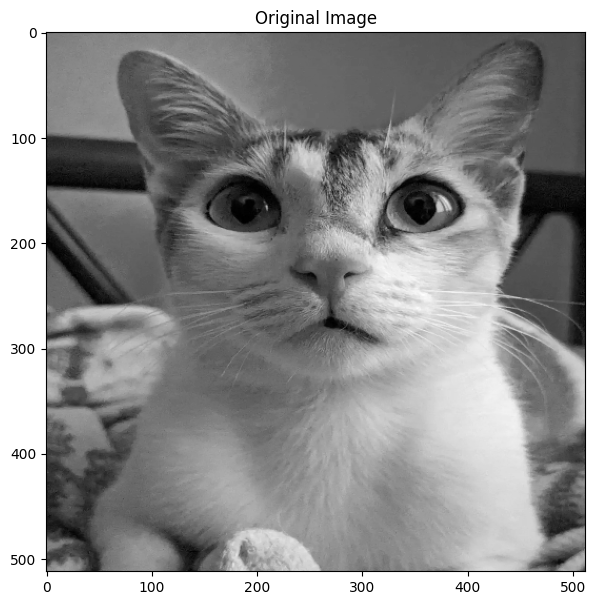

Effected Pixels: 13173
Lucky Pixels :  248971
Noise Applied on0.5% pixels
Generated Noisy Image Image : 1/20


<ipython-input-16-908640fa09ec>:21: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(10,2,i) #3


Generated Filtered Image : 2/20
Effected Pixels: 39519
Lucky Pixels :  222625
Noise Applied on1.5% pixels
Generated Noisy Image Image : 3/20
Generated Filtered Image : 4/20
Effected Pixels: 65865
Lucky Pixels :  196279
Noise Applied on2.5% pixels
Generated Noisy Image Image : 5/20
Generated Filtered Image : 6/20
Effected Pixels: 92211
Lucky Pixels :  169933
Noise Applied on3.5% pixels
Generated Noisy Image Image : 7/20
Generated Filtered Image : 8/20
Effected Pixels: 118558
Lucky Pixels :  143586
Noise Applied on4.5% pixels
Generated Noisy Image Image : 9/20
Generated Filtered Image : 10/20
Effected Pixels: 144904
Lucky Pixels :  117240
Noise Applied on5.5% pixels
Generated Noisy Image Image : 11/20
Generated Filtered Image : 12/20
Effected Pixels: 171250
Lucky Pixels :  90894
Noise Applied on6.5% pixels
Generated Noisy Image Image : 13/20
Generated Filtered Image : 14/20
Effected Pixels: 197596
Lucky Pixels :  64548
Noise Applied on7.5% pixels
Generated Noisy Image Image : 15/20
Gener

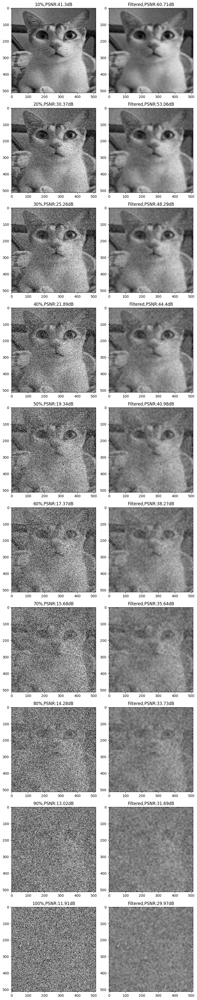

In [16]:
# Original Image Plot
plt.figure(figsize=(7,7))
plt.imshow(original_img,cmap='gray')
plt.title("Original Image")
plt.show()

plt.figure(figsize=(8,40))
plt.title("Noisy Image & Median Filter")
# Noisy - Filtered Image Plot

cnt = 10

for i in range(1,21,1):



    if i%2==1:
        # Noisy Image Show
        cur_noisy_img = make_noisy_image(img,float(i/(20-0.1)))
        print(f"Noise Applied on {round(float(i/(20-0.1)),2)*10}% pixels")
        plt.subplot(10,2,i) #3

        plt.imshow(cur_noisy_img,cmap='gray')
        plt.title(f"{cnt}%,PSNR:{calculate_PSNR(img,cur_noisy_img)}dB")
        cnt+=10
        print(f"Generated Noisy Image Image : {i}/20")

    else:
        # Filtered Image Show
        cur_filtered_img = filter_image(cur_noisy_img,"average")

        plt.subplot(10,2,i) #3

        plt.imshow(cur_filtered_img,cmap='gray')
        plt.title(f"Filtered,PSNR:{calculate_PSNR(img,cur_filtered_img)}dB")

        print(f"Generated Filtered Image : {i}/20")


plt.tight_layout()
plt.savefig("PSNR_TEST_AVG.jpg")
plt.show()
